# NaMIx Notebook
## Erläuterung
### Die Herausforderung

Für die Planung von neuen Quartieren benötigen Entscheidungstragende möglichst lange vor dem Bau Informationen darüber, wie gut nachhaltige Mobilität vor Ort möglich ist bzw. sein wird. Findet Mobilitätsplanung nämlich nicht früh genug statt, ist es sehr wahrscheinlich, dass sich Bewohnende an die Nutzung des eigenen Pkws gewöhnen. Dies im Nachhinein zu ändern ist sehr viel herausfordernder, als von Vorneherein gute Mobilität zu ermöglichen. Die Daten für die Einschätzung, wie gut diese Möglichkeiten bereits sind liegen allerdings oft verteilt vor und sind komplex. Planende fällen Entscheidungen daher oft eher basierend auf reinem Erfahrungswissen.

### Der Index

Wissenschaftler vom DLR Institut und Verkehrsforschung und Datenexperten des Startups Veomo Mobility GmbH entwickeln daher gemeinsam einen Index, der die Möglichkeit umwelt- und ressourcenschonend zu und von einer Adresse unterwegs zu sein beschreibt - den Nachhaltige-Mobilität-Index (NaMIx). Der Index bewertet für jede Adresse im Untersuchungsgebiet in München dieses Potential auf einer Skala von 10 (am geringsten) bis 100 (am höchsten). Die Entwicklung des Index fand im Rahmen eines mFUND-Projektes in einem wissensbasierten Verfahren statt (s. Box unten). Damit möglichst viele Personen den Index nutzen können, verwendet er offene Daten wie OpenStreetMap und frei verfügbare Softwareprogramme.

Er führt dafür 10 verschiedene Kennzahlen zu den folgenden Themengebieten zusammen:
* Eignung zum Zufußgehen, 
* Eignung zum Radfahren, 
* Erreichbarkeit von Verkehrsmitteln des öffentlichen Personennahverkehrs, 
* Verfügbarkeit von Sharing-Angeboten,
* Nahversorgung, 
* Gesundheitsversorgung und 
* Bildung. 

Jeder der Indikatoren wird mit 1 (am schlechtesten, rot) bis 10 (am besten, dunkelgrün) bewertet. 

Für die Indexberechnung haben wir frei verfügbarer Software und Daten (mit Ausnahme der Sharing-Daten) verwendet.


## Datengrundlagen
Für die Berechnung des Indikators werden die folgenden Daten benötigt:
* Ein OSM-Auszug des Gebietes (aktuell wird der OSM-Server direkt abgefragt)
* Eine Darstellung des ÖPNV über GTFS-Dateien, wird zumeist vom lokalen ÖPNV-Betreiber bereit gestellt
* Eine "Bounding Box" des Gebietes (ein Polygon, der das Gebiet beschreibt), abgelegt unter "./demo/input/research_area.gpkg"
* Informationen zu verfügbaren Sharing-Optionen als JSON-Datei, abgelegt unter "./demo/input/Sharing/9.json"

Aktuell liegt in dem "input"-Ordner die Definition des Gebietes, das innerhalb des Projektes NaMIx betrachtet worden ist.

Es ist zusätzlich nötig, die GTFS-Daten über die Stadt München herunter zu laden und sie in dem Ordner "input/GTFS" zu speichern.

## Ablauf
Die Berechnung erfolgt in drei Schritten:
* Schritt 1: Aufbereitung der Eingabedaten
* Schritt 2: Berechnung der Einzel-Indikatoren
* Schritt 3: Zusammenführen der Einzel-Indikatoren zum NaMIx-Index

Im Nachfolgenden werden diese Schritte durchgeführt.

## Anmerkungen zur Implementierung
Da die Berechnung einiger Indizes länger dauert, werden bereits berechnete Ergebnisse stets zwischengespeichert.

Möchte man das Programm auf ein neues Gebiet anwenden oder "frisch" laufen lassen, muss der Ordner ```demo/intermediate``` gelöscht werden.

## Schritt 1: Aufbereitung der Eingabedaten
### Definitionen und Vorprozessierung der BoundingBox

Zunächst werden die Ordner und der angenommene Puffer um Gebäude definiert...

In [1]:
import os
BASE_FOLDER = os.path.join(".", "demo")
INPUT_FOLDER = os.path.join(BASE_FOLDER, "input")
INTERMEDIATE_FOLDER = os.path.join(BASE_FOLDER, "intermediate")
TOOLS_FOLDER = os.path.join(BASE_FOLDER, "tools")

BUFFER_SIZE = 1000 # buffer size in meters

Das betrachtete Gebiet wird geladen und es wird um dieses ein Puffer gebildet. Alle betrachteten Infrastrukturen werden für das Gebiet mit dem Puffer bestimmt und in die Berechnung einbezogen, um Randeffekte zu vermeiden.

In [2]:
import geopandas as gpd
research_area = gpd.read_file(os.path.join(INPUT_FOLDER, "research_area.gpkg"))
research_area_buffered = research_area.copy(True)
buffers = research_area_buffered.geometry.buffer(BUFFER_SIZE)
research_area_buffered = gpd.GeoDataFrame(research_area_buffered, geometry=buffers, crs="EPSG:25832")
research_area_buffered_wgs84 = research_area_buffered.to_crs("EPSG:4326")

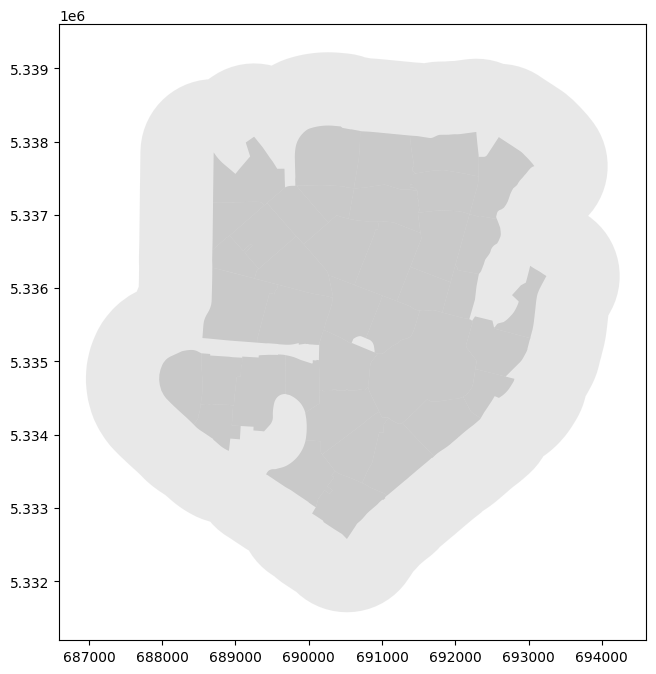

In [3]:
from pylab import *
ax = research_area.plot(figsize=(8,8), color='grey', alpha=.5)
ax = research_area_buffered.plot(ax=ax, color='lightgrey', linewidth=.3, alpha=.5)

### Extraktion der Verkehrsnetze
Aus der OSM-Datenbank werden drei Verkehrsnetze extrahiert:
* Zufußgehen
* Radfahren
* alle Modi

In [4]:
import osmnx
import namix.osm
import namix.util

# walk
walk_network_name = os.path.join(INTERMEDIATE_FOLDER, "network_walk.gpkg")
if not os.path.exists(walk_network_name):
    walk_network = namix.osm.get_network(research_area_buffered_wgs84, "walk")
    walk_network = namix.util.project_gdf(walk_network, to_crs=25832)
    walk_network.to_file(walk_network_name, driver="GPKG")
else:
    walk_network = gpd.read_file(walk_network_name)
# bike
bike_network_name = os.path.join(INTERMEDIATE_FOLDER, "network_bike.gpkg")
if not os.path.exists(bike_network_name):
    bike_network = namix.osm.get_network(research_area_buffered_wgs84, "bike")
    bike_network = namix.util.project_gdf(bike_network, to_crs=25832)
    bike_network.to_file(bike_network_name, driver="GPKG")
else:
    bike_network = gpd.read_file(bike_network_name)
# all
all_network_name = os.path.join(INTERMEDIATE_FOLDER, "network_all.gpkg")
if not os.path.exists(all_network_name):
    all_network = namix.osm.get_network(research_area_buffered_wgs84, "all")
    all_network = namix.util.project_gdf(all_network, to_crs=25832)
    all_network.to_file(all_network_name, driver="GPKG")
else:
    all_network = gpd.read_file(all_network_name)

Die Verkehrsnetze können nun dargestellt werden.

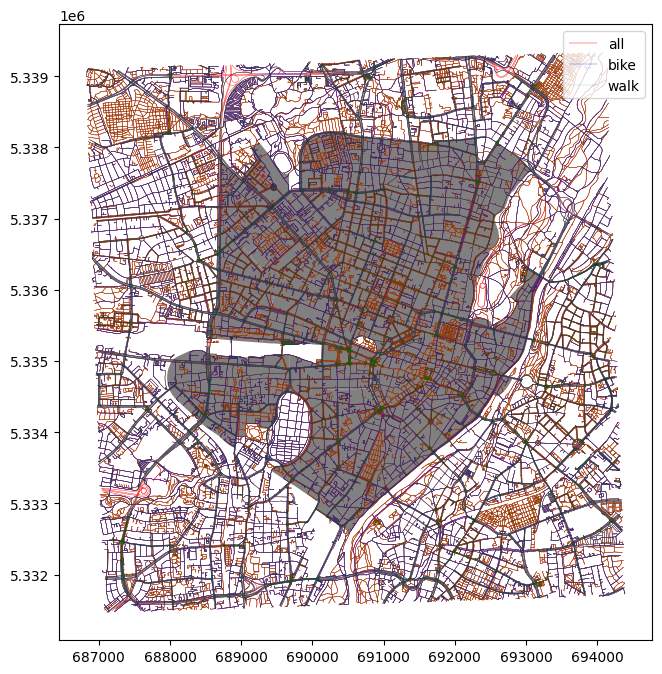

In [5]:
from pylab import *
ax = research_area.plot(figsize=(8,8), color='grey')
all_network.plot(ax=ax, color='red', linewidth=.3, label="all")
bike_network.plot(ax=ax, color='blue', linewidth=.2, label="bike")
ax = walk_network.plot(ax=ax, color='green', linewidth=.1, label="walk")
l = legend()

Da für die Berechnungen der Erreichbarkeiten das Software-Werkzeug "UrMoAC" genutzt wird, welches Netze und andere
Infrastrukturen in einem eigenen Format nutzt, werden die Verkehrsnetze für Zufußgehen und Radfahren in dieses Format 
überführt.

In [6]:
import math
walk_urmoac_network_name = os.path.join(INTERMEDIATE_FOLDER, "network_walk.wkt")
if not os.path.exists(walk_urmoac_network_name):
    with open(walk_urmoac_network_name, "w") as fdo:
        for index, row in walk_network.iterrows():
            oneway = row.oneway
            maxspeed = 5 if str(row.maxspeed)=="nan" or str(row.maxspeed)=="walk" else row.maxspeed
            fdo.write("%s;%s;%s;%s;%s;%s;%s;%s;%s\n" % (index, row.u, row.v, True, False, False, maxspeed, row.length, row.geometry))
bike_urmoac_network_name = os.path.join(INTERMEDIATE_FOLDER, "network_bike.wkt")
if not os.path.exists(bike_urmoac_network_name):
    with open(bike_urmoac_network_name, "w") as fdo:
        for index, row in bike_network.iterrows():
            oneway = row.oneway
            if str(row.maxspeed)=="walk":
                maxspeed = 5
            else:
                maxspeed = 20 if str(row.maxspeed)=="nan" else row.maxspeed
            fdo.write("%s;%s;%s;%s;%s;%s;%s;%s;%s\n" % (index, row.u, row.v, False, True, False, maxspeed, row.length, row.geometry))

### Vorprozessierung der Daten zu geteilt nutzbaren Mobilitätsoptionen
Der Datensatz zu Positionen von CarSharing-Fahrzeugen und BikeSharing-Rädern wird importiert, in ein vom NaMIx-Indikator nutzbares Format konvertiert und auf das um den Puffer erweitertes betrachtete Gebiet beschnitten.

In [7]:
import json
import pandas as pd
from shapely.geometry import Point

modes = ["bike", "car"]

sharing = {}
for mode in modes:
    sharing_name_mode = os.path.join(INTERMEDIATE_FOLDER, f"sharing_{mode}.gpkg")
    if not os.path.exists(sharing_name_mode):
        sharing_name = os.path.join(INPUT_FOLDER, "Sharing", "9.json")
        with open(sharing_name) as fd:
            sharing_all = json.load(fd)
            sharing_all = pd.json_normalize(sharing_all)
            sharing_mode = sharing_all[mode].tolist()[0]
            sharing_mode = [Point(t[::-1]) for t in sharing_mode]
            d = {"name": list(range(0, len(sharing_mode))), "geometry":sharing_mode}
            sharing_mode = gpd.GeoDataFrame(d, geometry="geometry", crs="EPSG:4326")
            sharing[mode] = sharing_mode.to_crs("EPSG:25832")
            sharing[mode].to_file(sharing_name_mode, driver="GPKG")
    else:
        sharing[mode] = gpd.read_file(sharing_name_mode)

Das Ergebnis sind die Positionen von erreichbaren CarSharing-Fahrzeugen und BikeSharing-Rädern.

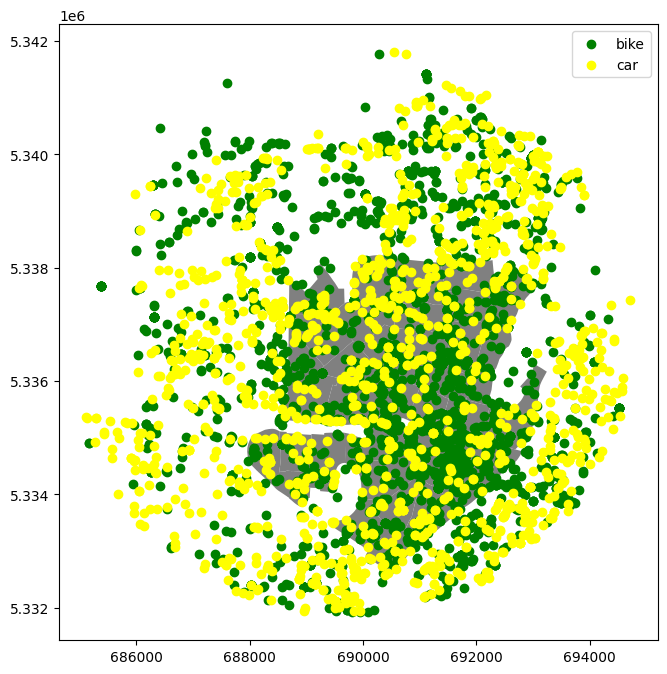

In [8]:
from pylab import *
mode2color = {
    "bike": "green",
    "car": "yellow",
}
ax = research_area.plot(figsize=(8,8), color='grey')
for m in modes:
    ax = sharing[m].plot(ax=ax, color=mode2color[m], label=m)
l = legend()

### Infrastrukturen aus OSM extrahieren
Die Positionen von Supermärkten und Einrichtungen der Gesundheitsversorgung werden aus OSM für das erweiterte Gebiet extrahiert.

In [9]:
facilities = {
    "school": {'amenity': 'school'},
    "healthcare": {'amenity': ['hospital', 'pharmacy', 'doctors', 'clinic', 'dentist']},
    "supermarket": {'shop': ['supermarket', 'bakery', 'convenience']},
    "building": {'building': True}
}
facility2color = {
    "school": "cyan",
    "healthcare": "blue",
    "supermarket": "red"
}

In [10]:
import osmnx
bounds = research_area_buffered_wgs84.unary_union.bounds
facilities_gdf = {}
for f in facilities:
    facilities_name = os.path.join(INTERMEDIATE_FOLDER, f"facilities_{f}.gpkg")
    if not os.path.exists(facilities_name):
        facilities_gdf[f] = osmnx.features_from_bbox(north=bounds[3], south=bounds[1], east=bounds[2], west=bounds[0], tags=facilities[f])
        facilities_gdf[f] = facilities_gdf[f].to_crs("EPSG:25832")
        d = {'mid': [], 'idx': [], 'geometry': []}
        mid = 0
        for index, row in facilities_gdf[f].iterrows():
            d["mid"].append(mid)
            d["idx"].append(index[0] + "_" + str(index[1]))
            d["geometry"].append(row.geometry.centroid)
            
        facilities_gdf[f] = gpd.GeoDataFrame(d, geometry="geometry", crs="EPSG:25832")
        facilities_name2 = os.path.join(INTERMEDIATE_FOLDER, f"facilities_{f}.wkt")
        with open(facilities_name2, "w") as fdo:
            i = 0
            for index, row in facilities_gdf[f].iterrows():
                fdo.write("%s;point(%s %s)\n" % (i, row.geometry.x, row.geometry.y))
                i = i + 1
        facilities_gdf[f].to_file(facilities_name, driver="GPKG")
    else:
        facilities_gdf[f] = gpd.read_file(facilities_name)

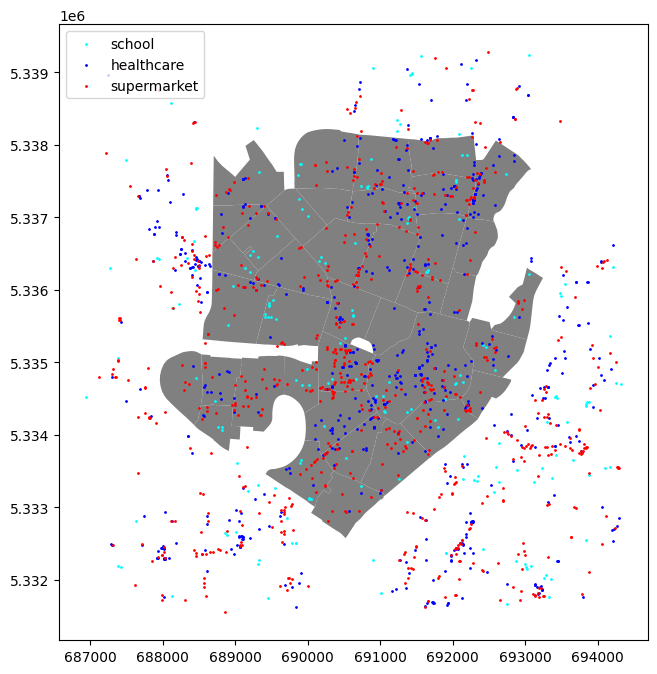

In [11]:
from pylab import *
ax = research_area.plot(figsize=(8,8), color='grey')
for f in facility2color:
    facilities_gdf[f].plot(ax=ax, color=facility2color[f], markersize=1, label=f)
x = legend()

### Gebäude auf das Gebiet beschneiden
Die heruntergeladenen Gebäudedaten werden auf das Untersuchungsgebiet beschnitten.

In [12]:
buildings_name = os.path.join(INTERMEDIATE_FOLDER, "buildings.gpkg")
if not os.path.exists(buildings_name):
    tmp = facilities_gdf["building"]
    buildings = tmp.loc[tmp.within(research_area.unary_union)].copy()
    buildings['mid'] = np.arange(len(buildings))
    buildings_name2 = os.path.join(INTERMEDIATE_FOLDER, "buildings.wkt")
    with open(buildings_name2, "w") as fdo:
        i = 0
        for index, row in buildings.iterrows():
            c = row.geometry.centroid
            fdo.write("%s;point(%s %s)\n" % (row.mid, c.x, c.y))
            i = i + 1
    buildings.to_file(buildings_name, driver="GPKG")
else:
    buildings = gpd.read_file(buildings_name)

Das Ergebnis sind die Positionen der Gebäude innerhalb des betrachteten Gebietes.

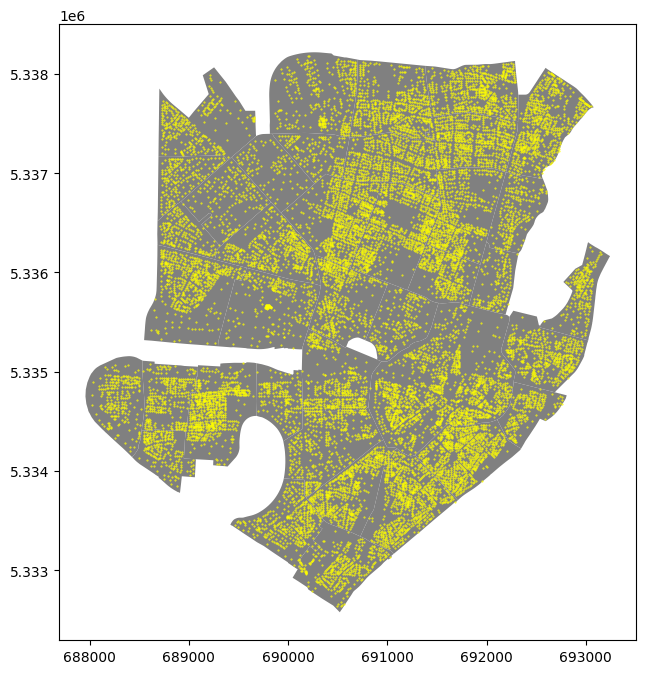

In [13]:
ax = research_area.plot(figsize=(8,8), color='grey')
ax = buildings.plot(ax=ax, color='yellow', markersize=.2)

### Bilden der Gebäude-Puffer
Um später Infrastrukturen im Umkreis von 1000 m für jedes Gebäude zu bestimmen, wird um jedes Gebäude ein entsprechender Puffer berechnet.

In [14]:
building_buffers_name = os.path.join(INTERMEDIATE_FOLDER, "building_buffers.gpkg")
if not os.path.exists(building_buffers_name):
    buffer_size = 1000
    building_buffers = buildings.copy(True)
    buffers = building_buffers.geometry.buffer(buffer_size)
    building_buffers = gpd.GeoDataFrame(building_buffers, geometry=buffers, crs="EPSG:25832")
    building_buffers.to_file(building_buffers_name, driver="GPKG")
else:
    building_buffers = gpd.read_file(building_buffers_name)

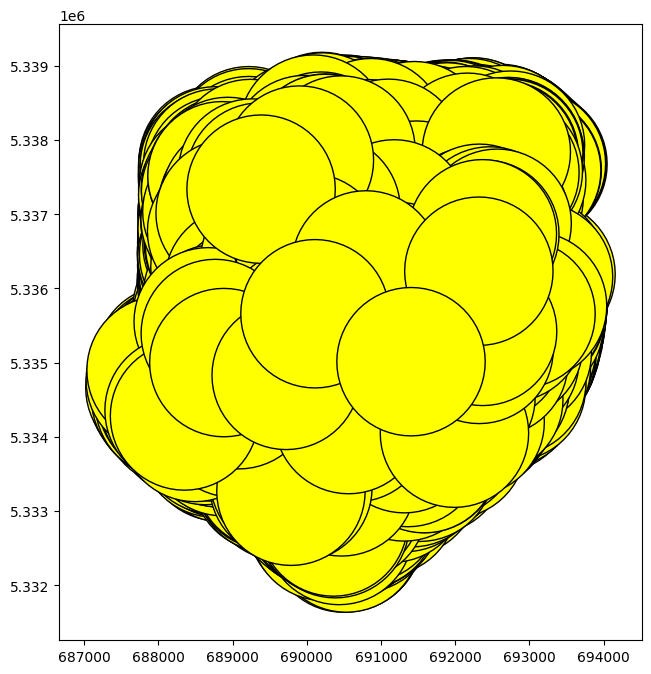

In [15]:
ax = research_area.plot(figsize=(8,8), color='grey')
ax = building_buffers.plot(ax=ax, color='yellow', edgecolor="black")

### GTFS-Daten beschneiden
Der GTFS-Datensatz wird auf das erweiterte betrachtete Gebiet beschnitten.

Für den Zugang zum ÖPNV werden zwar nur die Positionen der ÖPNV-Haltestellen benötigt, allerdings klassifiziert nach "langsamen" und "schnellen" ÖPNV. Daher ist eine komplexere Verarbeitung der GTFS-Daten notwendig.

**<font color="red">Bitte beachten Sie, dass diese Berechnung länger dauert...</font>**

In [16]:
# types: 704: Stadtbus, 402: U-Bahn, 900: Tram, 702: Expressbus
import pandas as pd
import pickle
import os
stops_slow_name = os.path.join(INTERMEDIATE_FOLDER, "stops_slow.gpkg")
stops_fast_name = os.path.join(INTERMEDIATE_FOLDER, "stops_fast.gpkg")
if not os.path.exists(stops_slow_name):
    print ("routes")
    gtfs_routes_name = os.path.join(INPUT_FOLDER, "GTFS", "routes.txt")
    routes = pd.read_csv(gtfs_routes_name, sep=",", header=0, usecols=[0, 5])
    route2type = {}
    for index, row in routes.iterrows():
        route2type[row[0]] = int(row[1])
    print ("trips")
    gtfs_trips_name = os.path.join(INPUT_FOLDER, "GTFS", "trips.txt")
    trips = pd.read_csv(gtfs_trips_name, sep=",", header=0, usecols=[0, 2])
    trip2route = {}
    for index, row in trips.iterrows():
        trip2route[row[1]] = row[0]
    print ("stops")
    gtfs_stops_name = os.path.join(INPUT_FOLDER, "GTFS", "stops.txt")
    stops = pd.read_csv(gtfs_stops_name, sep=",", header=0, usecols=[0, 5])
    stop2parent = {}
    for index, row in stops.iterrows():
        stop2parent[row[0]] = row[1]
    print ("times")
    gtfs_stop_times_name = os.path.join(INPUT_FOLDER, "GTFS", "stop_times.txt")
    stop_times = pd.read_csv(gtfs_stop_times_name, sep=",", header=0, usecols=[0, 3])
    stop2types = {}
    for index, row in stop_times.iterrows():
        stop_id = stop2parent[row[1]] if stop2parent[row[1]] is not None and stop2parent[row[1]]!="" else row[1]
        if stop_id not in stop2types:
            stop2types[stop_id] = []
        route = trip2route[row[0]]
        rtype = route2type[route]
        stop2types[stop_id].append(rtype)
    print ("2types")
    #fd = open("stop2types.pickle", "wb")
    #pickle.dump(stop2types, fd)
    #fd.close()

    #fd = open("stop2types.pickle", "rb")
    #stop2types = pickle.load(fd)
    #fd.close()
   
    gtfs_stops_name = os.path.join(INPUT_FOLDER, "GTFS", "stops.txt")
    df = pd.read_csv(gtfs_stops_name, sep=",", header=0, usecols=[0, 2, 3, 5], decimal='.')
    df = df.set_axis(['stop_id', 'lon', 'lat', 'parent'], axis='columns')
    #print (df)
    gtfs_orig = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lat, df.lon), crs="EPSG:4326")
    gtfs_orig = gtfs_orig.to_crs("EPSG:25832")
    #gtfs_orig.to_file("stops.gpkg", driver="GPKG")
    stops = gtfs_orig.loc[gtfs_orig.within(research_area_buffered.unary_union)].copy()
    stops_slow = {'idx': [], 'geometry': []}
    stops_fast = {'idx': [], 'geometry': []}
    seen_slow = set()
    seen_fast = set()
    for index, row in stops.iterrows():
        stop_id = row.parent if str(row.parent)!="nan" and row.parent is not None and row.parent!="" else row.stop_id
        if stop_id not in stop2types:
            print ("Missing %s" % (stop_id))
            continue
        if stop_id not in seen_fast and (900 in stop2types[stop_id] or 702 in stop2types[stop_id]):
            stops_fast["idx"].append(stop_id)
            stops_fast["geometry"].append(row.geometry.centroid)
            seen_fast.add(stop_id)
        if stop_id not in seen_slow and (402 in stop2types[stop_id] or 704 in stop2types[stop_id]):
            stops_slow["idx"].append(stop_id)
            stops_slow["geometry"].append(row.geometry.centroid)
            seen_slow.add(stop_id)
    stops_slow = gpd.GeoDataFrame(stops_slow, geometry="geometry", crs="EPSG:25832")
    stops_fast = gpd.GeoDataFrame(stops_fast, geometry="geometry", crs="EPSG:25832")
    stops_slow.to_file(stops_slow_name, driver="GPKG")
    stops_fast.to_file(stops_fast_name, driver="GPKG")
else:
    stops_slow = gpd.read_file(stops_slow_name)
    stops_fast = gpd.read_file(stops_fast_name)

routes
trips
stops
times
2types


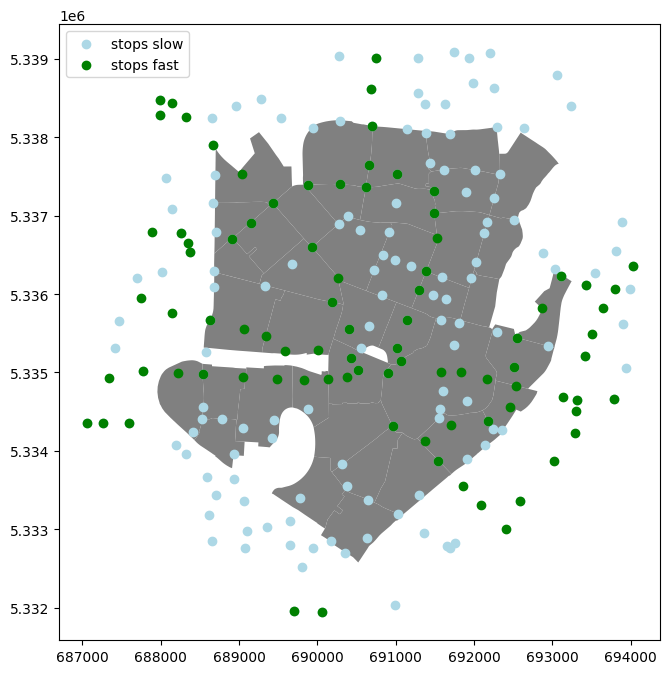

In [17]:
from pylab import *
ax = research_area.plot(figsize=(8,8), color='grey')
stops_slow.plot(ax=ax, color="lightblue", label="stops slow")
stops_fast.plot(ax=ax, color="green", label="stops fast")
x = legend()

Das auch die Erreichbarkeiten der ÖPNV-Haltestellen mit UrMoAC berechnet werden, werden die erhaltenen Positionen 
dieser in ein entsprechendes Format überführt.

In [18]:
urmoac_stops_slow_name = os.path.join(INTERMEDIATE_FOLDER, "stops_slow.wkt")
with open(urmoac_stops_slow_name, "w") as fdo:
    i = 0
    for index, row in stops_slow.iterrows():
        c = row.geometry.centroid
        fdo.write("%s;point(%s %s)\n" % (i, c.x, c.y))
        i = i + 1
urmoac_stops_fast_name = os.path.join(INTERMEDIATE_FOLDER, "stops_fast.wkt")
with open(urmoac_stops_fast_name, "w") as fdo:
    i = 0
    for index, row in stops_fast.iterrows():
        c = row.geometry.centroid
        fdo.write("%s;point(%s %s)\n" % (i, c.x, c.y))
        i = i + 1        

## Schritt 2: Berechnung der Einzel-Indikatoren
Jeder Einzel-Indikator wird für sich berechnet.

Zunächst werden die Indikatorwerte für jedes Gebäude berechnet, danach werden sie auf die Spanne zwischen 1 und 10 normiert.

Wie schon bei der Vorprozessierung werden die berechneten Indikatoren gespeichert um beim wiederholten Ausführen des Notebooks Rechenzeit zu sparen.

Zunächst wird eine Hilfsmethode für das Berechnen von Erreichbarkeitsmaßen definiert.

In [19]:
def compute_accessibilities(from_name, to_name, output_name, network_name, mode, maxtt, result_index, buildings):
    maxtt = "--shortest " if maxtt<0 else f"--max-tt {maxtt} "
    urmoac_call = (
        f"java -jar -Xmx12g {TOOLS_FOLDER}/UrMoAC-0.6.0.jar "
        f"--from {from_name} "
        f"--to {to_name} "
        f"--mode {mode} "
        f"--time 0 "
        f"--epsg 25832 "
        f"-o {output_name} " 
        f"--verbose "
        f"--net {network_name} "
        f"{maxtt} "
        f"--to-agg all "
    )
    print (urmoac_call)
    os.system(urmoac_call)
    vals = {}
    with open(output_name) as fd:
        for l in fd:
            v = l.strip().split(";")
            vals[int(v[0])] = float(v[result_index])
    i = 0
    indicator_values = {}
    for index, row in buildings.iterrows():
        indicator_values[row.mid] = vals[i]
        i = i + 1
    return indicator_values

### Indicator A1: Anzahl Kreuzungen im Fußwegnetz pro Meter
Zunächst werden die Positionen der Kreuzungen im Fußgängernetz bestimmt...

In [20]:
# get node coordinates
from shapely.geometry import Point
walk_nodes_name = os.path.join(INTERMEDIATE_FOLDER, "walk_nodes.gpkg")
if not os.path.exists(walk_nodes_name):
    nodes = {}
    for index, row in walk_network.iterrows():
        nodes[row['u']] = Point(row['geometry'].coords[0])
        nodes[row['v']] = Point(row['geometry'].coords[-1])
    d = {"node_id":[], "geometry":[]}
    for n in nodes:
        d["node_id"].append(n)
        d["geometry"].append(nodes[n])
    walk_nodes = gpd.GeoDataFrame(d, geometry="geometry", crs="EPSG:25832")
    walk_nodes.to_file(walk_nodes_name, driver="GPKG")
else:
    walk_nodes = gpd.read_file(walk_nodes_name)

... und dargestellt.

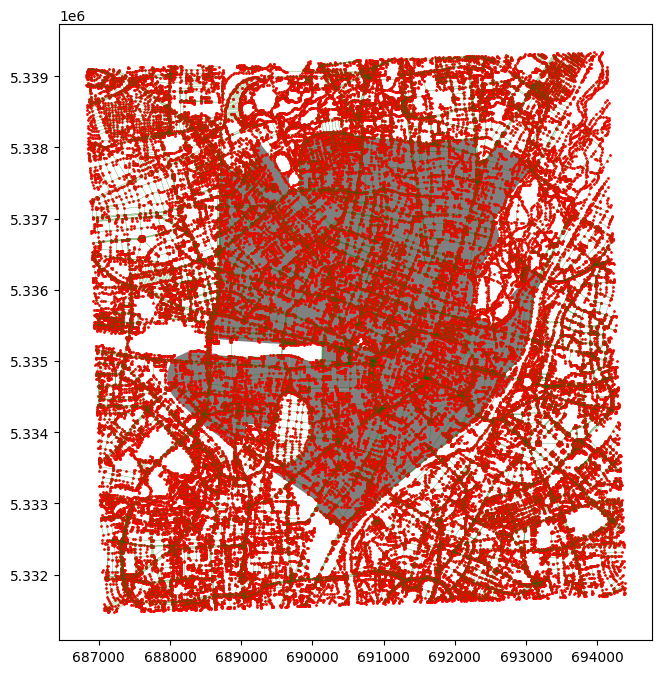

In [21]:
ax = research_area.plot(figsize=(8,8), color='grey')
walk_network.plot(ax=ax, color='green', linewidth=.1)
ax = walk_nodes.plot(ax=ax, color='red', markersize=1)

Danach werden die Positionen der Fußgängerkreuzungen mit den Puffern der Gebäude (1000 m) verschnitten.
Das Ergebnis ist die Menge der Fußgängerkreuzungen im Umkreis von 1000 m für jedes Gebäude.

**<font color="red">Bitte beachten Sie, dass dieser Indikator eine lange Berechnungszeit hat. In der Zukunft wird dieses optimiert werden.</font>**

In [22]:
import namix.indicator_helpers
indicator_a1_normed_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_a1_normed.pickle")
indicator_a1_normed = namix.indicator_helpers.load_indicator_pickle(indicator_a1_normed_filename)
if indicator_a1_normed is None:
    indicator_a1 = {}
    for index, row in building_buffers.iterrows():
        pip = walk_nodes.within(row.geometry)
        walk_nodes_within = walk_nodes.loc[pip].copy()
        indicator_a1[row.mid] = len(walk_nodes_within)
    indicator_a1_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_a1.pickle")
    namix.indicator_helpers.write_indicator_pickle(indicator_a1_filename, indicator_a1)
    indicator_a1_normed = namix.indicator_helpers.get_normed(buildings, indicator_a1)
    namix.indicator_helpers.write_indicator_pickle(indicator_a1_normed_filename, indicator_a1_normed)

Der berechnete Indikator wird dargestellt, zunächst in der Kartenansicht...

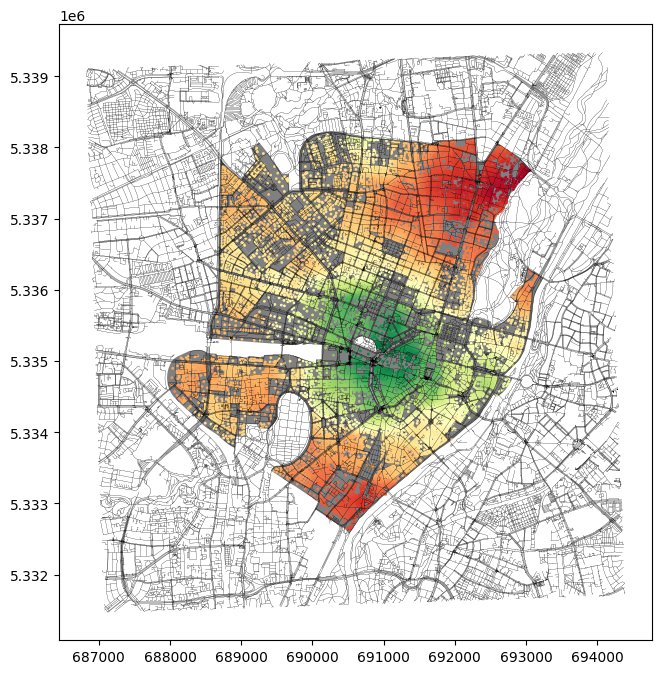

In [23]:
import namix.indicator_helpers
ax = research_area.plot(figsize=(8,8), color='grey')
walk_network.plot(ax=ax, color='black', linewidth=.1)
colors = namix.indicator_helpers.to_colors(buildings, indicator_a1_normed, "RdYlGn")
ax = buildings.plot(ax=ax, color=colors, markersize=1)

... sowie als Verteilung der normierten Werte.

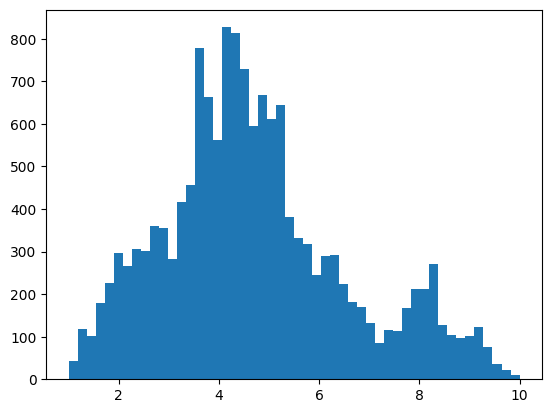

In [24]:
from pylab import *
values = [indicator_a1_normed[i] for i in indicator_a1_normed]
ret = hist(values, bins=50, range=(1, 10))

### Indicator B1: Anteil der Fahrradwege im Straßennetz
Hier wird für alle Gebäude bestimmt, wie viele Fahrradwege und wieviele Straßen insgesamt innerhalb ihres jeweiligen Puffers liegen.

**<font color="red">Bitte beachten Sie, dass dieser Indikator eine lange Berechnungszeit hat. In der Zukunft wird dieses optimiert werden.</font>**

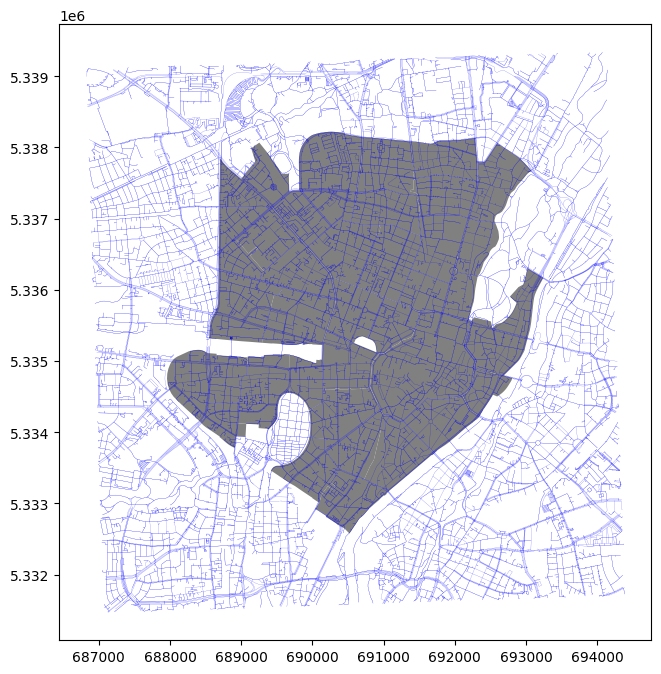

In [25]:
ax = research_area.plot(figsize=(8,8), color='grey')
ax = bike_network.plot(ax=ax, color='blue', linewidth=.1)

In [26]:
import namix.indicator_helpers
indicator_b1_normed_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_b1_normed.pickle")
indicator_b1_normed = namix.indicator_helpers.load_indicator_pickle(indicator_b1_normed_filename)
if indicator_b1_normed is None:
    indicator_b1 = {}
    for index, row in building_buffers.iterrows():
        pip = bike_network.within(row.geometry)
        bike_ways_within = bike_network.loc[pip].copy()
        pip = all_network.within(row.geometry)
        all_ways_within = all_network.loc[pip].copy()
        indicator_b1[row.mid] = len(bike_ways_within) / len(all_ways_within)
    indicator_b1_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_b1.pickle")
    namix.indicator_helpers.write_indicator_pickle(indicator_b1_filename, indicator_b1)
    indicator_b1_normed = namix.indicator_helpers.get_normed(buildings, indicator_b1)
    namix.indicator_helpers.write_indicator_pickle(indicator_b1_normed_filename, indicator_b1_normed)

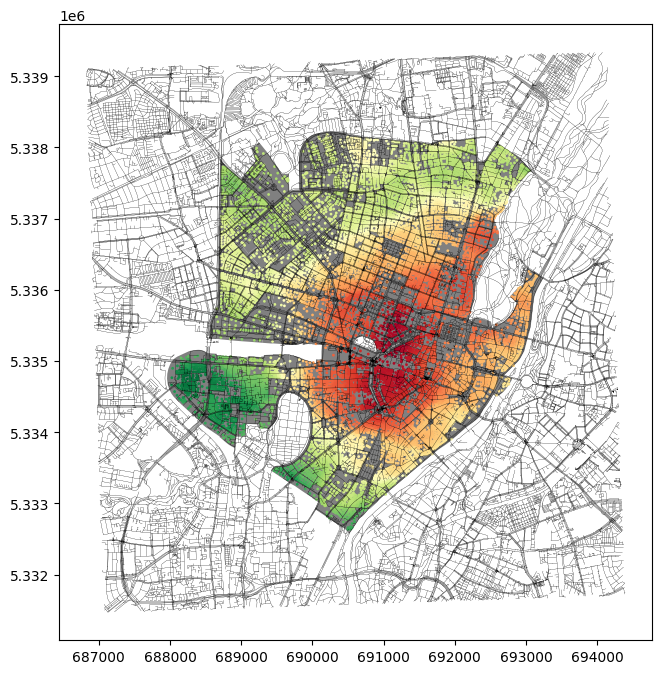

In [27]:
import namix.indicator_helpers
ax = research_area.plot(figsize=(8,8), color='grey')
walk_network.plot(ax=ax, color='black', linewidth=.1)
colors = namix.indicator_helpers.to_colors(buildings, indicator_b1_normed, "RdYlGn")
ax = buildings.plot(ax=ax, color=colors, markersize=1)

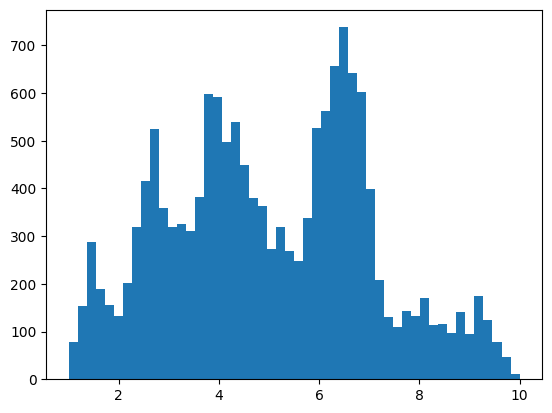

In [28]:
from pylab import *
values = [indicator_b1_normed[i] for i in indicator_b1_normed]
ret = hist(values, bins=50, range=(1, 10))

### Indicator C1: Erreichbarkeit nächste Haltestelle des langsamen ÖPNV (Bus, Tram)
Für die Berechnung wird die Software "UrMoAC" genutzt, mit Gebäuden als Startpunkte und ÖPNV-Haltestellen des "langsamen" ÖPNV als Ziele.

In [30]:
import namix.indicator_helpers
indicator_c1_normed_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_c1_normed.pickle")
indicator_c1_normed = namix.indicator_helpers.load_indicator_pickle(indicator_c1_normed_filename)
if indicator_c1_normed is None:
    from_name = os.path.join(INTERMEDIATE_FOLDER, "buildings.wkt")
    to_name = os.path.join(INTERMEDIATE_FOLDER, "stops_slow.wkt")
    output_name = os.path.join(INTERMEDIATE_FOLDER, "buildings2stops_slow.csv")
    network_name = os.path.join(INTERMEDIATE_FOLDER, "network_walk.wkt")
    indicator_c1 = compute_accessibilities(from_name, to_name, output_name, network_name, "foot", -1, 3, buildings)
    indicator_c1_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_c1.pickle")
    namix.indicator_helpers.write_indicator_pickle(indicator_c1_filename, indicator_c1)
    indicator_c1_normed = namix.indicator_helpers.get_reverse_normed(buildings, indicator_c1)
    namix.indicator_helpers.write_indicator_pickle(indicator_c1_normed_filename, indicator_c1_normed)

java -jar -Xmx12g .\demo\tools/UrMoAC-0.6.0.jar --from .\demo\intermediate\buildings.wkt --to .\demo\intermediate\stops_slow.wkt --mode foot --time 0 --epsg 25832 -o .\demo\intermediate\buildings2stops_slow.csv --verbose --net .\demo\intermediate\network_walk.wkt --shortest  --to-agg all 


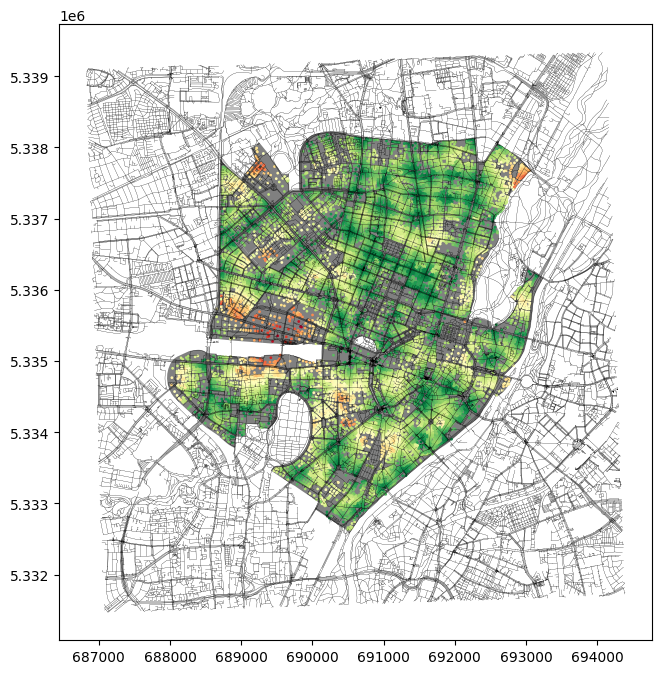

In [31]:
import namix.indicator_helpers
ax = research_area.plot(figsize=(8,8), color='grey')
walk_network.plot(ax=ax, color='black', linewidth=.1)
colors = namix.indicator_helpers.to_colors(buildings, indicator_c1_normed, "RdYlGn")
ax = buildings.plot(ax=ax, color=colors, markersize=1)

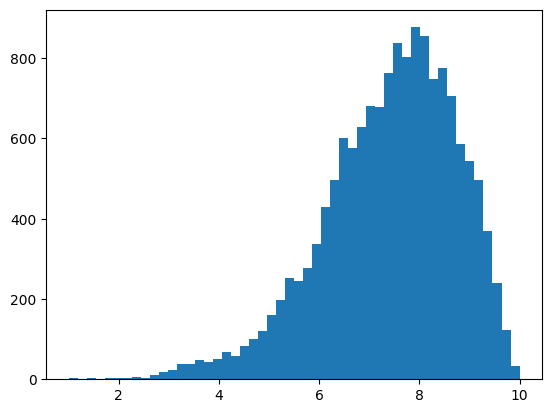

In [32]:
from pylab import *
values = [indicator_c1_normed[i] for i in indicator_c1_normed]
ret = hist(values, bins=50, range=(1, 10))

### Indicator C2: Erreichbarkeit nächste Haltestelle des schnellen ÖPNV (U-Bahn)
Für die Berechnung wird die Software "UrMoAC" genutzt, mit Gebäuden als Startpunkte und ÖPNV-Haltestellen des "schnellen" ÖPNV als Ziele.

In [33]:
import namix.indicator_helpers
indicator_c2_normed_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_c2_normed.pickle")
indicator_c2_normed = namix.indicator_helpers.load_indicator_pickle(indicator_c2_normed_filename)
if indicator_c2_normed is None:
    from_name = os.path.join(INTERMEDIATE_FOLDER, "buildings.wkt")
    to_name = os.path.join(INTERMEDIATE_FOLDER, "stops_fast.wkt")
    output_name = os.path.join(INTERMEDIATE_FOLDER, "buildings2stops_fast.csv")
    network_name = os.path.join(INTERMEDIATE_FOLDER, "network_walk.wkt")
    indicator_c2 = compute_accessibilities(from_name, to_name, output_name, network_name, "foot", -1, 3, buildings)
    indicator_c2_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_c2.pickle")
    namix.indicator_helpers.write_indicator_pickle(indicator_c2_filename, indicator_c2)
    indicator_c2_normed = namix.indicator_helpers.get_reverse_normed(buildings, indicator_c2)
    namix.indicator_helpers.write_indicator_pickle(indicator_c2_normed_filename, indicator_c2_normed)

java -jar -Xmx12g .\demo\tools/UrMoAC-0.6.0.jar --from .\demo\intermediate\buildings.wkt --to .\demo\intermediate\stops_fast.wkt --mode foot --time 0 --epsg 25832 -o .\demo\intermediate\buildings2stops_fast.csv --verbose --net .\demo\intermediate\network_walk.wkt --shortest  --to-agg all 


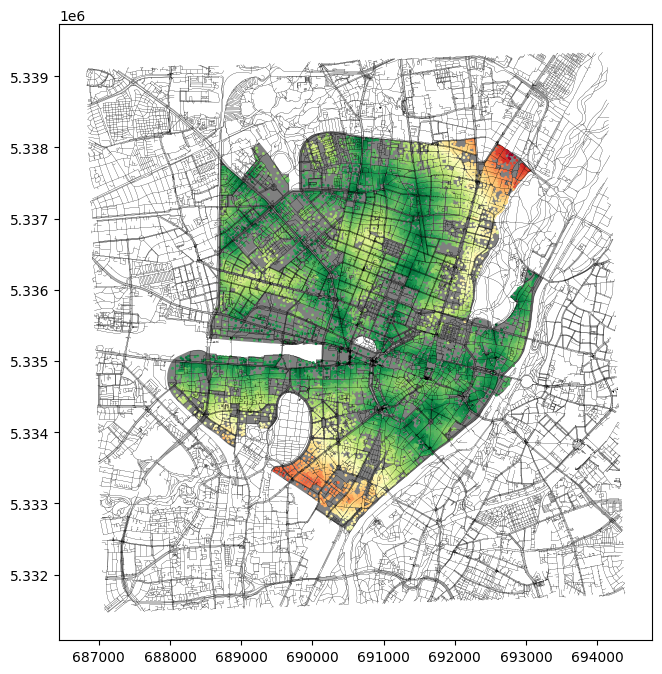

In [34]:
import namix.indicator_helpers
ax = research_area.plot(figsize=(8,8), color='grey')
walk_network.plot(ax=ax, color='black', linewidth=.1)
colors = namix.indicator_helpers.to_colors(buildings, indicator_c2_normed, "RdYlGn")
ax = buildings.plot(ax=ax, color=colors, markersize=1)

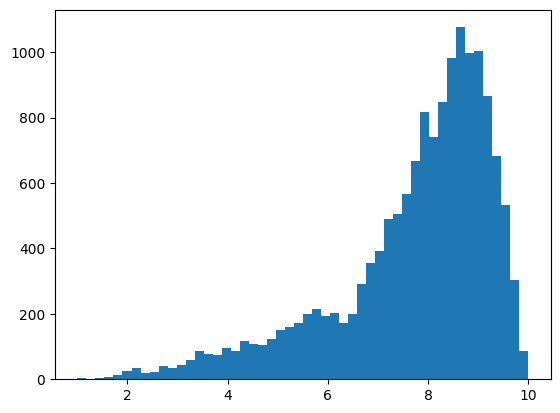

In [35]:
from pylab import *
values = [indicator_c2_normed[i] for i in indicator_c2_normed]
ret = hist(values, bins=50, range=(1, 10))

### Indicator D1: Anzahl verfügbarer Carsharing-Fahrzeuge in 1 Kilometer Umkreis
Die Positionen verfügbarer CarSharing-Autos werden mit den Gebäudepuffern verschnitten.

In [36]:
import namix.indicator_helpers
indicator_d1_normed_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_d1_normed.pickle")
indicator_d1_normed = namix.indicator_helpers.load_indicator_pickle(indicator_d1_normed_filename)
if indicator_d1_normed is None:
    indicator_d1 = {}
    for index, row in building_buffers.iterrows():
        pip = sharing["car"].within(row.geometry)
        cars_within = sharing["car"].loc[pip].copy()
        indicator_d1[row.mid] = len(cars_within)
    indicator_d1_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_d1.pickle")
    namix.indicator_helpers.write_indicator_pickle(indicator_d1_filename, indicator_d1)
    indicator_d1_normed = namix.indicator_helpers.get_normed(buildings, indicator_d1)
    namix.indicator_helpers.write_indicator_pickle(indicator_d1_normed_filename, indicator_d1_normed)

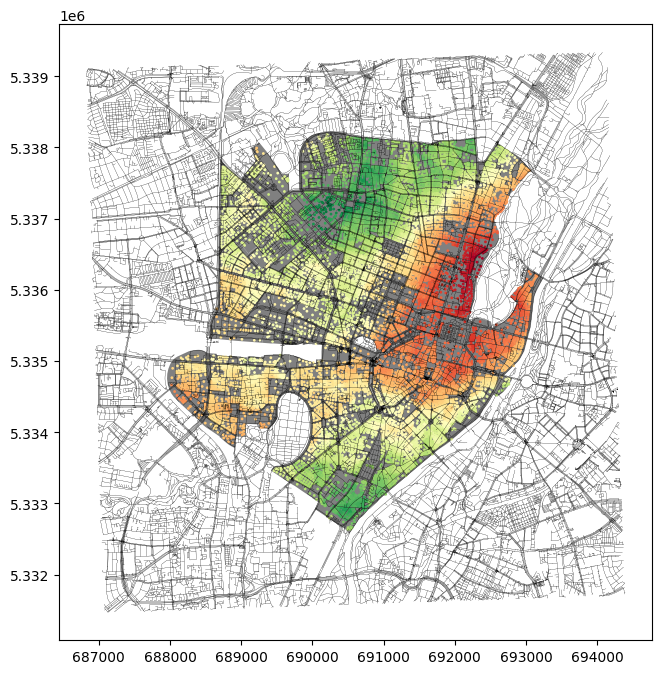

In [37]:
import namix.indicator_helpers
ax = research_area.plot(figsize=(8,8), color='grey')
walk_network.plot(ax=ax, color='black', linewidth=.1)
colors = namix.indicator_helpers.to_colors(buildings, indicator_d1_normed, "RdYlGn")
ax = buildings.plot(ax=ax, color=colors, markersize=1)

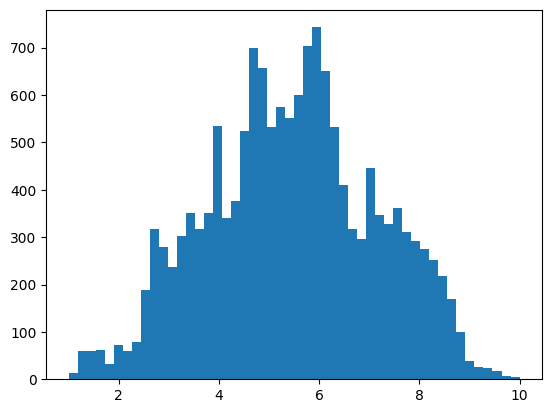

In [38]:
from pylab import *
values = [indicator_d1_normed[i] for i in indicator_d1_normed]
ret = hist(values, bins=50, range=(1, 10))

### Indicator D2: Anzahl verfügbarer Leihräder in 1 Kilometer Umkreis
Die Positionen verfügbarer BikeSharing-Räder werden mit den Gebäudepuffern verschnitten.

In [39]:
import namix.indicator_helpers
indicator_d2_normed_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_d2_normed.pickle")
indicator_d2_normed = namix.indicator_helpers.load_indicator_pickle(indicator_d2_normed_filename)
if indicator_d2_normed is None:
    indicator_d2 = {}
    for index, row in building_buffers.iterrows():
        pip = sharing["bike"].within(row.geometry)
        bikes_within = sharing["bike"].loc[pip].copy()
        indicator_d2[row.mid] = len(bikes_within)
    indicator_d2_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_d2.pickle")
    namix.indicator_helpers.write_indicator_pickle(indicator_d2_filename, indicator_d2)
    indicator_d2_normed = namix.indicator_helpers.get_normed(buildings, indicator_d2)
    namix.indicator_helpers.write_indicator_pickle(indicator_d2_normed_filename, indicator_d2_normed)

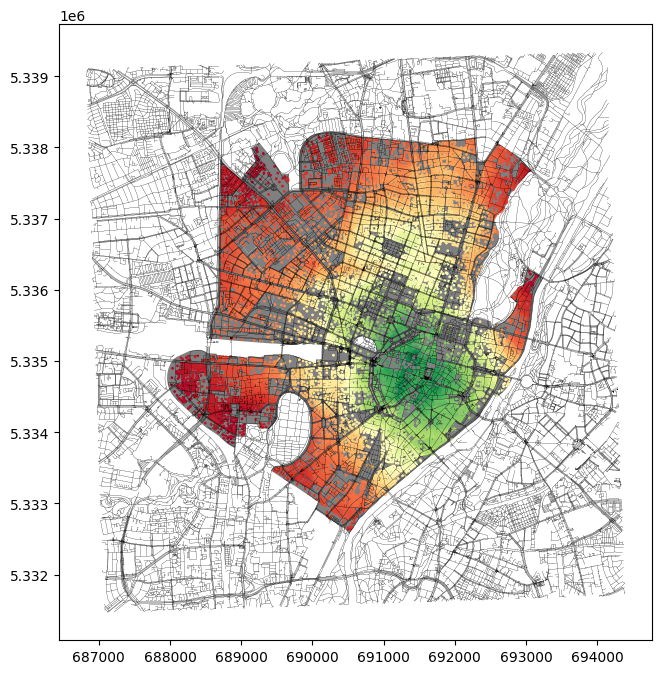

In [40]:
import namix.indicator_helpers
ax = research_area.plot(figsize=(8,8), color='grey')
walk_network.plot(ax=ax, color='black', linewidth=.1)
colors = namix.indicator_helpers.to_colors(buildings, indicator_d2_normed, "RdYlGn")
ax = buildings.plot(ax=ax, color=colors, markersize=1)

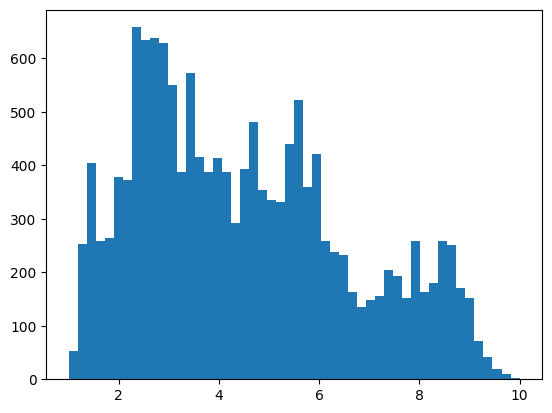

In [41]:
from pylab import *
values = [indicator_d2_normed[i] for i in indicator_d2_normed]
ret = hist(values, bins=50, range=(1, 10))

### Indicator E1: Anzahl Supermärkte zu Fuß (in 10 Minuten erreichbar)
Mithilfe des Programms UrMoAC wird für jedes Gebäude die Anzahl der innerhalb von 10 Minuten jeweils erreichbarer Supermärkte berechnet.

In [42]:
import namix.indicator_helpers
indicator_e1_normed_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_e1_normed.pickle")
indicator_e1_normed = namix.indicator_helpers.load_indicator_pickle(indicator_e1_normed_filename)
if indicator_e1_normed is None:
    from_name = os.path.join(INTERMEDIATE_FOLDER, "buildings.wkt")
    to_name = os.path.join(INTERMEDIATE_FOLDER, "facilities_supermarket.wkt")
    output_name = os.path.join(INTERMEDIATE_FOLDER, "buildings2supermarket.csv")
    network_name = os.path.join(INTERMEDIATE_FOLDER, "network_walk.wkt")
    indicator_e1 = compute_accessibilities(from_name, to_name, output_name, network_name, "foot", 600, 4, buildings)
    indicator_e1_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_e1.pickle")
    namix.indicator_helpers.write_indicator_pickle(indicator_e1_filename, indicator_e1)
    indicator_e1_normed = namix.indicator_helpers.get_normed(buildings, indicator_e1)
    namix.indicator_helpers.write_indicator_pickle(indicator_e1_normed_filename, indicator_e1_normed)

java -jar -Xmx12g .\demo\tools/UrMoAC-0.6.0.jar --from .\demo\intermediate\buildings.wkt --to .\demo\intermediate\facilities_supermarket.wkt --mode foot --time 0 --epsg 25832 -o .\demo\intermediate\buildings2supermarket.csv --verbose --net .\demo\intermediate\network_walk.wkt --max-tt 600  --to-agg all 


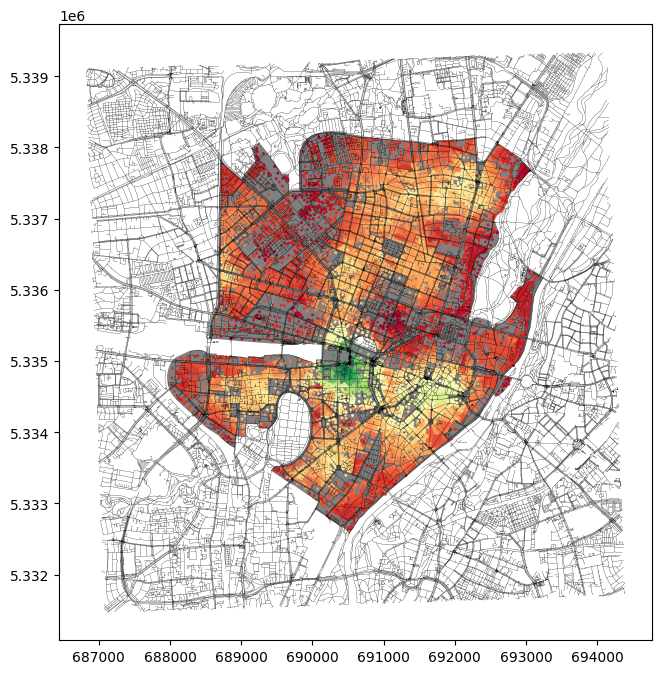

In [43]:
import namix.indicator_helpers
ax = research_area.plot(figsize=(8,8), color='grey')
walk_network.plot(ax=ax, color='black', linewidth=.1)
colors = namix.indicator_helpers.to_colors(buildings, indicator_e1_normed, "RdYlGn")
ax = buildings.plot(ax=ax, color=colors, markersize=1)

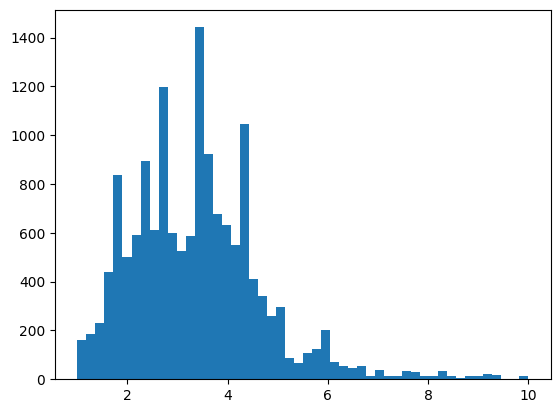

In [44]:
from pylab import *
values = [indicator_e1_normed[i] for i in indicator_e1_normed]
ret = hist(values, bins=50, range=(1, 10))

### Indicator E2: Anzahl Gesundheitseinrichtungen zu Fuß (in 10 Minuten erreichbar)
Mithilfe des Programms UrMoAC wird für jedes Gebäude die Anzahl der innerhalb von 10 Minuten jeweils erreichbarer Gesundheitseinrichtungen berechnet.

In [45]:
import namix.indicator_helpers
indicator_e2_normed_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_e2_normed.pickle")
indicator_e2_normed = namix.indicator_helpers.load_indicator_pickle(indicator_e2_normed_filename)
if indicator_e2_normed is None:
    from_name = os.path.join(INTERMEDIATE_FOLDER, "buildings.wkt")
    to_name = os.path.join(INTERMEDIATE_FOLDER, "facilities_healthcare.wkt")
    output_name = os.path.join(INTERMEDIATE_FOLDER, "buildings2healthcare.csv")
    network_name = os.path.join(INTERMEDIATE_FOLDER, "network_walk.wkt")
    indicator_e2 = compute_accessibilities(from_name, to_name, output_name, network_name, "foot", 600, 4, buildings)
    indicator_e2_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_e2.pickle")
    namix.indicator_helpers.write_indicator_pickle(indicator_e2_filename, indicator_e2)
    indicator_e2_normed = namix.indicator_helpers.get_normed(buildings, indicator_e2)
    namix.indicator_helpers.write_indicator_pickle(indicator_e2_normed_filename, indicator_e2_normed)

java -jar -Xmx12g .\demo\tools/UrMoAC-0.6.0.jar --from .\demo\intermediate\buildings.wkt --to .\demo\intermediate\facilities_healthcare.wkt --mode foot --time 0 --epsg 25832 -o .\demo\intermediate\buildings2healthcare.csv --verbose --net .\demo\intermediate\network_walk.wkt --max-tt 600  --to-agg all 


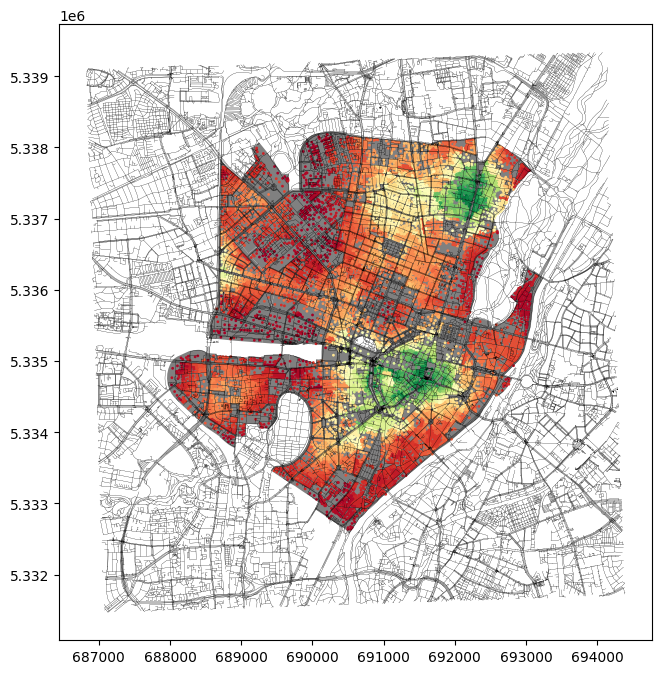

In [46]:
import namix.indicator_helpers
ax = research_area.plot(figsize=(8,8), color='grey')
walk_network.plot(ax=ax, color='black', linewidth=.1)
colors = namix.indicator_helpers.to_colors(buildings, indicator_e2_normed, "RdYlGn")
ax = buildings.plot(ax=ax, color=colors, markersize=1)

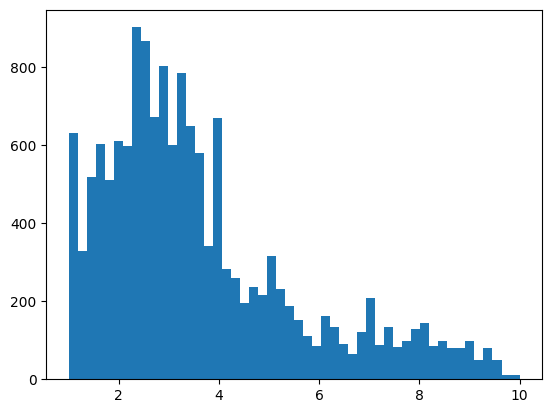

In [47]:
from pylab import *
values = [indicator_e2_normed[i] for i in indicator_e2_normed]
ret = hist(values, bins=50, range=(1, 10))

### Indicator F1: Erreichbarkeit nächste Schule zu Fuß (in Minuten)
Mithilfe des Programms UrMoAC wird für jedes Gebäude die Reisezeit zu Fuß zur jeweils nächsten Schule berechnet.

In [48]:
import namix.indicator_helpers
indicator_f1_normed_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_f1_normed.pickle")
indicator_f1_normed = namix.indicator_helpers.load_indicator_pickle(indicator_f1_normed_filename)
if indicator_f1_normed is None:
    from_name = os.path.join(INTERMEDIATE_FOLDER, "buildings.wkt")
    to_name = os.path.join(INTERMEDIATE_FOLDER, "facilities_school.wkt")
    output_name = os.path.join(INTERMEDIATE_FOLDER, "buildings2schools_walk.csv")
    network_name = os.path.join(INTERMEDIATE_FOLDER, "network_walk.wkt")
    indicator_f1 = compute_accessibilities(from_name, to_name, output_name, network_name, "foot", -1, 3, buildings)
    indicator_f1_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_f1.pickle")
    namix.indicator_helpers.write_indicator_pickle(indicator_f1_filename, indicator_f1)
    indicator_f1_normed = namix.indicator_helpers.get_reverse_normed(buildings, indicator_f1)
    namix.indicator_helpers.write_indicator_pickle(indicator_f1_normed_filename, indicator_f1_normed)

java -jar -Xmx12g .\demo\tools/UrMoAC-0.6.0.jar --from .\demo\intermediate\buildings.wkt --to .\demo\intermediate\facilities_school.wkt --mode foot --time 0 --epsg 25832 -o .\demo\intermediate\buildings2schools_walk.csv --verbose --net .\demo\intermediate\network_walk.wkt --shortest  --to-agg all 


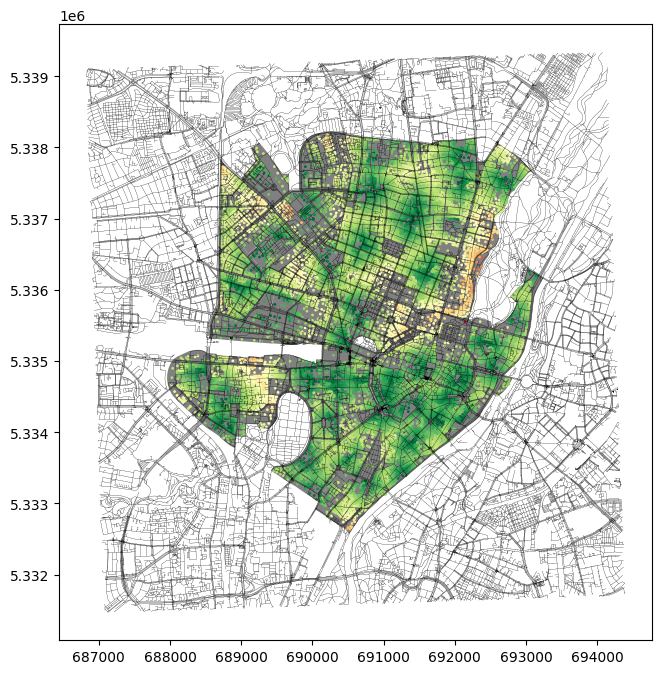

In [49]:
import namix.indicator_helpers
ax = research_area.plot(figsize=(8,8), color='grey')
walk_network.plot(ax=ax, color='black', linewidth=.1)
colors = namix.indicator_helpers.to_colors(buildings, indicator_f1_normed, "RdYlGn")
ax = buildings.plot(ax=ax, color=colors, markersize=1)

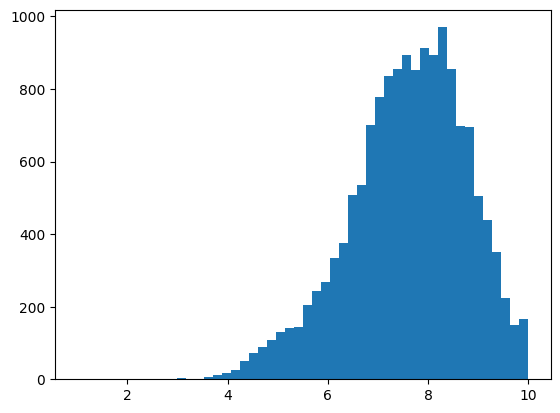

In [50]:
from pylab import *
values = [indicator_f1_normed[i] for i in indicator_f1_normed]
ret = hist(values, bins=50, range=(1, 10))

### Indicator F2: Erreichbarkeit nächste Schule mit dem Fahrrad (in Minuten)
Mithilfe des Programms UrMoAC wird für jedes Gebäude die Reisezeit mit dem Rad zur jeweils nächsten Schule berechnet.

In [51]:
import namix.indicator_helpers
indicator_f2_normed_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_f2_normed.pickle")
indicator_f2_normed = namix.indicator_helpers.load_indicator_pickle(indicator_f2_normed_filename)
if indicator_f2_normed is None:
    from_name = os.path.join(INTERMEDIATE_FOLDER, "buildings.wkt")
    to_name = os.path.join(INTERMEDIATE_FOLDER, "facilities_school.wkt")
    output_name = os.path.join(INTERMEDIATE_FOLDER, "buildings2schools_bike.csv")
    network_name = os.path.join(INTERMEDIATE_FOLDER, "network_bike.wkt")
    indicator_f2 = compute_accessibilities(from_name, to_name, output_name, network_name, "bicycle", -1, 3, buildings)
    indicator_f2_filename = os.path.join(INTERMEDIATE_FOLDER, "indicator_f2.pickle")
    namix.indicator_helpers.write_indicator_pickle(indicator_f2_filename, indicator_f2)
    indicator_f2_normed = namix.indicator_helpers.get_reverse_normed(buildings, indicator_f2)
    namix.indicator_helpers.write_indicator_pickle(indicator_f2_normed_filename, indicator_f2_normed)

java -jar -Xmx12g .\demo\tools/UrMoAC-0.6.0.jar --from .\demo\intermediate\buildings.wkt --to .\demo\intermediate\facilities_school.wkt --mode bicycle --time 0 --epsg 25832 -o .\demo\intermediate\buildings2schools_bike.csv --verbose --net .\demo\intermediate\network_bike.wkt --shortest  --to-agg all 


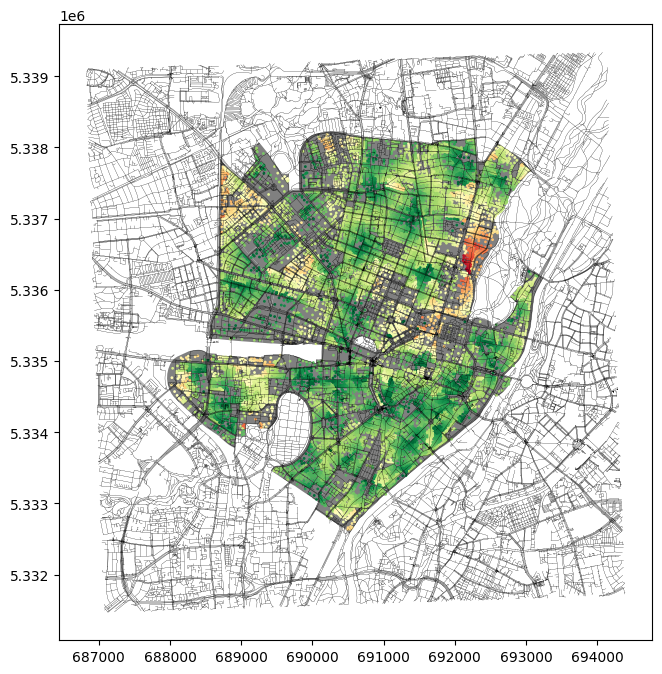

In [52]:
import namix.indicator_helpers
ax = research_area.plot(figsize=(8,8), color='grey')
walk_network.plot(ax=ax, color='black', linewidth=.1)
colors = namix.indicator_helpers.to_colors(buildings, indicator_f2_normed, "RdYlGn")
ax = buildings.plot(ax=ax, color=colors, markersize=1)

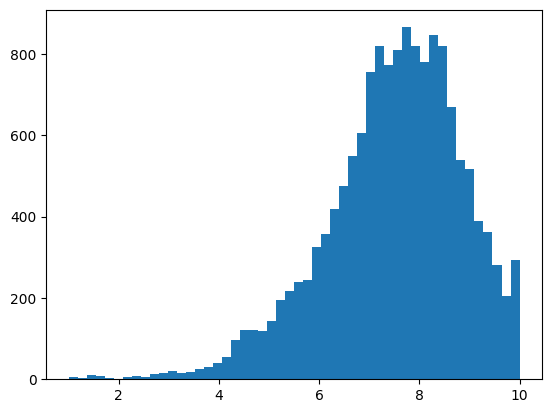

In [53]:
from pylab import *
values = [indicator_f2_normed[i] for i in indicator_f2_normed]
ret = hist(values, bins=50, range=(1, 10))

## Zusammenführen der Einzel-Indikatoren zum NaMIx-Index
Die berechneten Einzel-Indikatoren werden für jedes Gebäude zum NaMIx-Index aufsummiert.

In [54]:
namix_full = {}
for index, row in buildings.iterrows():
    value = 0
    value += indicator_a1_normed[row.mid]
    value += indicator_b1_normed[row.mid]
    value += indicator_c1_normed[row.mid]
    value += indicator_c2_normed[row.mid]
    value += indicator_d1_normed[row.mid]
    value += indicator_d2_normed[row.mid]
    value += indicator_e1_normed[row.mid]
    value += indicator_e2_normed[row.mid]
    value += indicator_f1_normed[row.mid]
    value += indicator_f2_normed[row.mid]
    namix_full[row.mid] = value

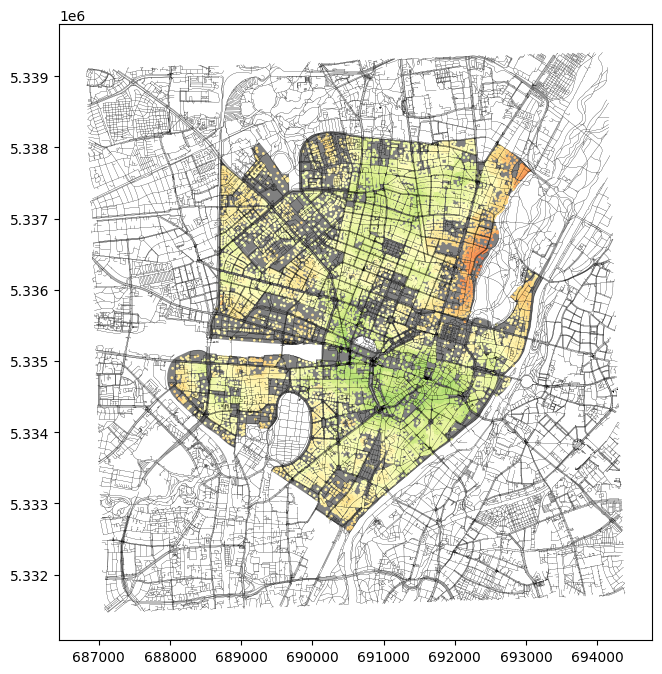

In [55]:
import namix.indicator_helpers
ax = research_area.plot(figsize=(8,8), color='grey')
walk_network.plot(ax=ax, color='black', linewidth=.1)
colors = namix.indicator_helpers.to_colors(buildings, namix_full, "RdYlGn", 10, 100)
a = buildings.plot(ax=ax, color=colors, markersize=1)

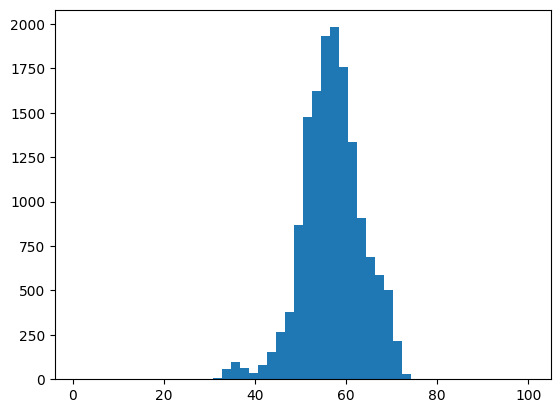

In [56]:
from pylab import *
values = [namix_full[i] for i in namix_full]
ret = hist(values, bins=50, range=(1, 100))

## Herausschreiben der Ergebnisse
Die Indikatoren werden zusammen mit den Geometrien der Gebäude als Geopackage herausgeschrieben.

In [57]:
namix_filename = os.path.join(BASE_FOLDER, "namix.gpkg")
output = {'idx': [], 'a1': [], 'b1': [], 'c1': [], 'c2': [], 'd1': [], 'd2': [], 'e1': [], 'e2': [], 'f1': [], 'f2': [], 'namix': [], 'geometry': []}
for index, row in buildings.iterrows():
    output["idx"].append(index)
    output["a1"].append(indicator_a1_normed[row.mid])
    output["b1"].append(indicator_b1_normed[row.mid])
    output["c1"].append(indicator_c1_normed[row.mid])
    output["c2"].append(indicator_c2_normed[row.mid])
    output["d1"].append(indicator_d1_normed[row.mid])
    output["d2"].append(indicator_d2_normed[row.mid])
    output["e1"].append(indicator_e1_normed[row.mid])
    output["e2"].append(indicator_e2_normed[row.mid])
    output["f1"].append(indicator_f1_normed[row.mid])
    output["f2"].append(indicator_f2_normed[row.mid])
    output["namix"].append(namix_full[row.mid])
    output["geometry"].append(row.geometry.centroid)
output = gpd.GeoDataFrame(output, geometry="geometry", crs="EPSG:25832")
output.to_file(namix_filename, driver="GPKG")